**Movenet_Multiperson**

https://tfhub.dev/google/movenet/multipose/lightning/1

https://www.section.io/engineering-education/multi-person-pose-estimator-with-python/

##**Import Libs and Load Model**

In [17]:
import tensorflow as tf
import tensorflow_hub as hub
import cv2
from matplotlib import pyplot as plt
import numpy as np
from google.colab.patches import cv2_imshow
import os

In [2]:
model = hub.load('https://tfhub.dev/google/movenet/multipose/lightning/1')
movenet = model.signatures['serving_default']

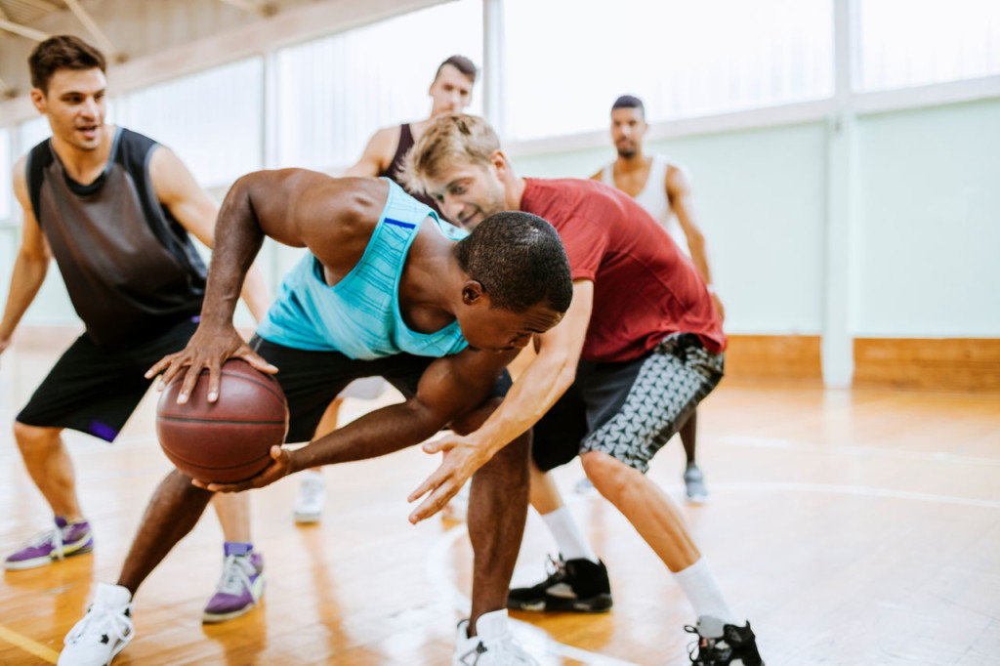

In [6]:
# Load Single image
image_path = '/content/drive/MyDrive/imgs_test_set/2.jpeg'

# Read the image
frame = cv2.imread(image_path)

# Check if the image is loaded successfully
if frame is not None:
    cv2_imshow(frame)
    cv2.waitKey(0)
    cv2.destroyAllWindows()
else:
    print("Error loading image. Please check the file path.")

##**Helpers**

In [12]:
EDGES = {
    (0, 1): 'm',
    (0, 2): 'c',
    (1, 3): 'm',
    (2, 4): 'c',
    (0, 5): 'm',
    (0, 6): 'c',
    (5, 7): 'm',
    (7, 9): 'm',
    (6, 8): 'c',
    (8, 10): 'c',
    (5, 6): 'y',
    (5, 11): 'm',
    (6, 12): 'c',
    (11, 12): 'y',
    (11, 13): 'm',
    (13, 15): 'm',
    (12, 14): 'c',
    (14, 16): 'c'
}

In [9]:
def loop_through_people(frame, keypoints_with_scores, edges, confidence_threshold):
    for person in keypoints_with_scores:
        draw_connections(frame, person, edges, confidence_threshold)
        draw_keypoints(frame, person, confidence_threshold)

In [10]:
def draw_keypoints(frame, keypoints, confidence_threshold):
    y, x, c = frame.shape
    shaped = np.squeeze(np.multiply(keypoints, [y,x,1]))

    for kp in shaped:
        ky, kx, kp_conf = kp
        if kp_conf > confidence_threshold:
            cv2.circle(frame, (int(kx), int(ky)), 6, (0,255,0), -1)

In [11]:
def draw_connections(frame, keypoints, edges, confidence_threshold):
    y, x, c = frame.shape
    shaped = np.squeeze(np.multiply(keypoints, [y,x,1]))

    for edge, color in edges.items():
        p1, p2 = edge
        y1, x1, c1 = shaped[p1]
        y2, x2, c2 = shaped[p2]

        if (c1 > confidence_threshold) & (c2 > confidence_threshold):
            cv2.line(frame, (int(x1), int(y1)), (int(x2), int(y2)), (0,0,255), 4)

##**Load image set and Inference**

In [16]:
image_folder="/content/drive/MyDrive/imgs_test_set"
output_folder="/content/drive/MyDrive/imgs_test_set/MoveNet/multi_per"

In [22]:
def process_and_show_image(image_path,output_folder):
  frame= cv2.imread(image_path)

  # Resize image to fit needs on documentation
  img = frame.copy()
  img = tf.image.resize_with_pad(tf.expand_dims(img, axis=0), 384, 640)
  input_img = tf.cast(img, dtype=tf.int32)

  # Detection section
  results = movenet(input_img)
  keypoints_with_scores = results['output_0'].numpy()[:, :, :51].reshape((6, 17, 3))

  # Render keypoints for each detected instance
  loop_through_people(frame, keypoints_with_scores, EDGES, 0.1)  # 0.1 is our confidence_threshold

  #save results in output Folder
  output_path = os.path.join(output_folder, os.path.basename(image_path))
  plt.imsave(output_path, frame)

  # Display the result
  cv2_imshow(frame)
  cv2.waitKey(0)
  cv2.destroyAllWindows()


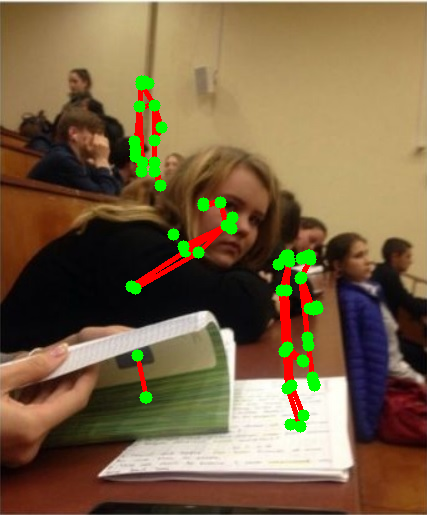

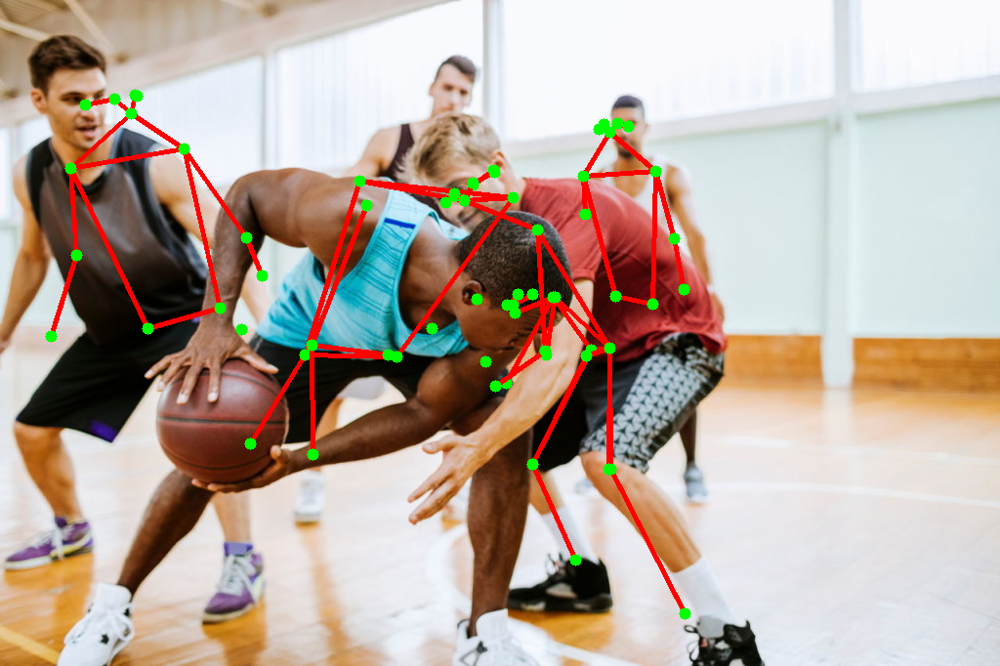

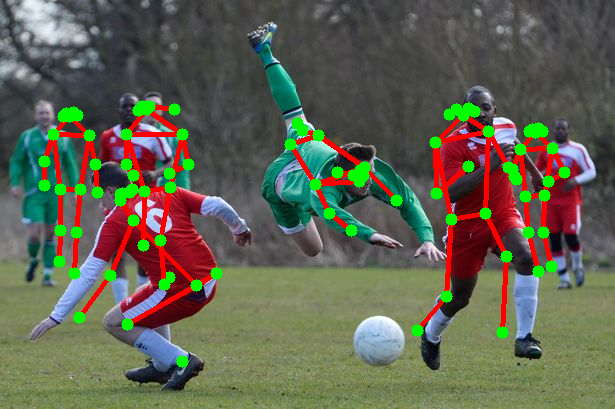

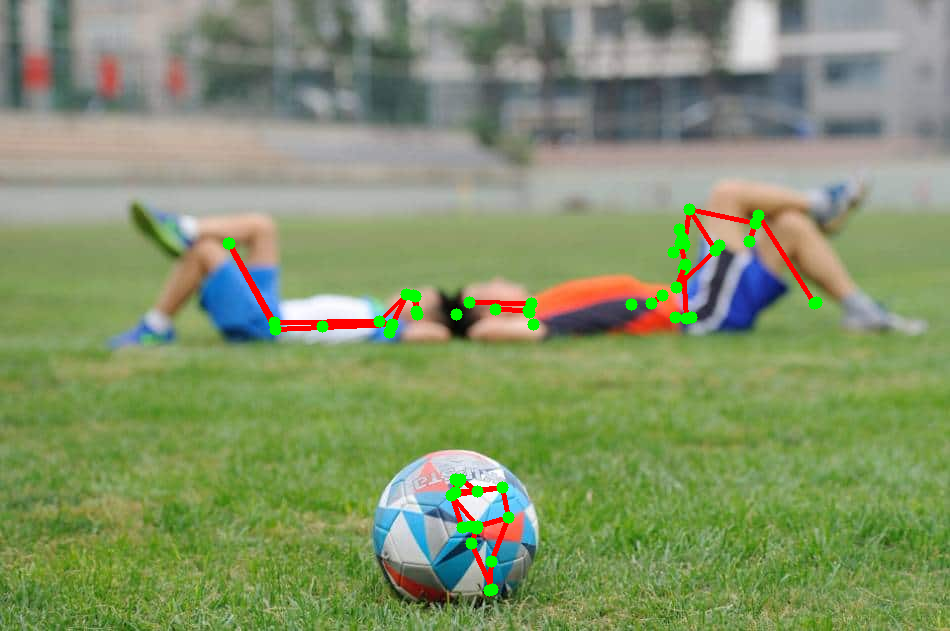

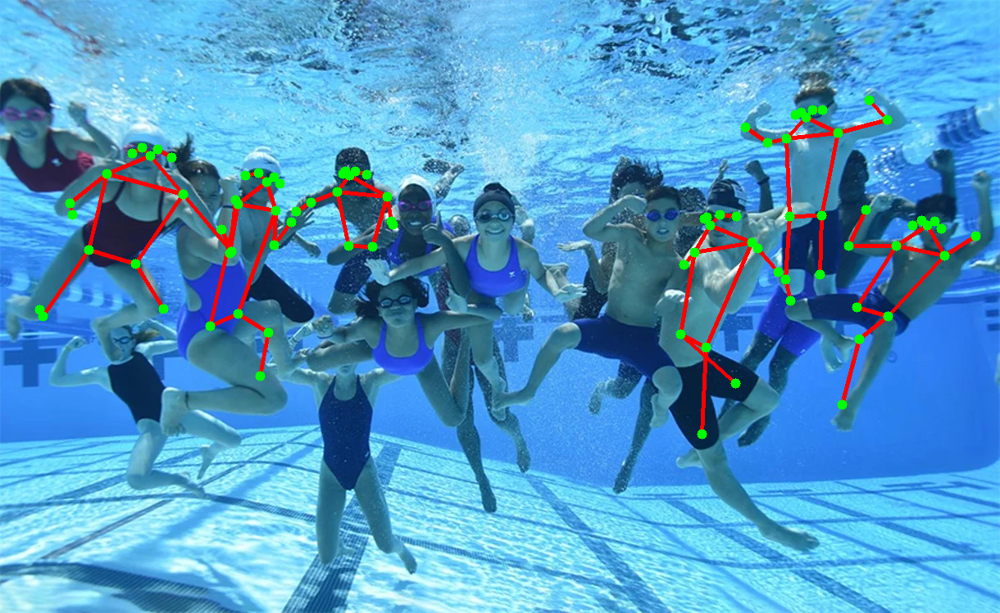

...

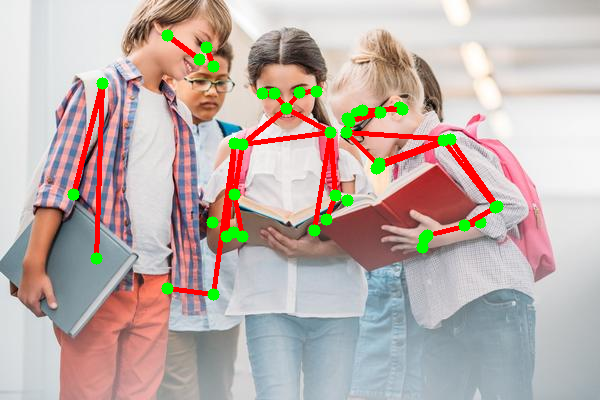

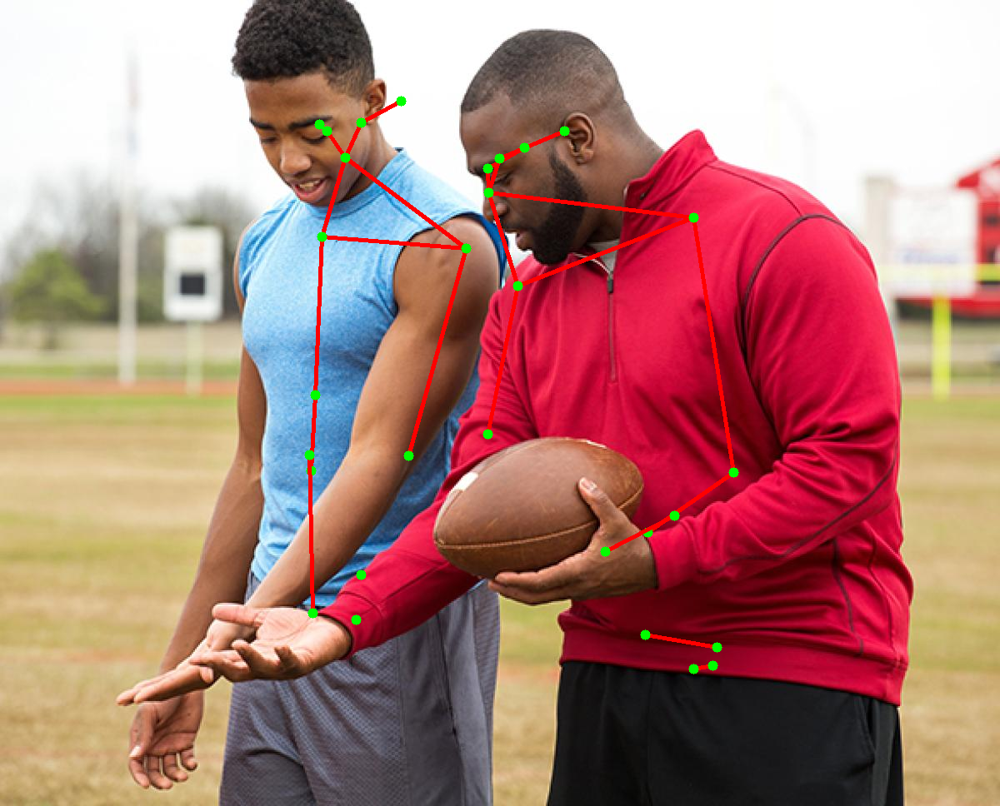

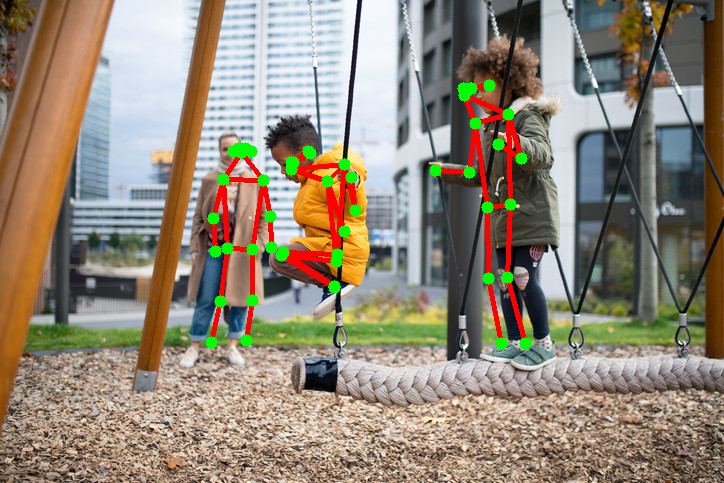

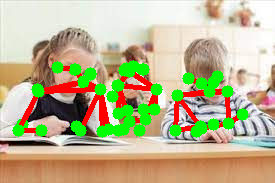

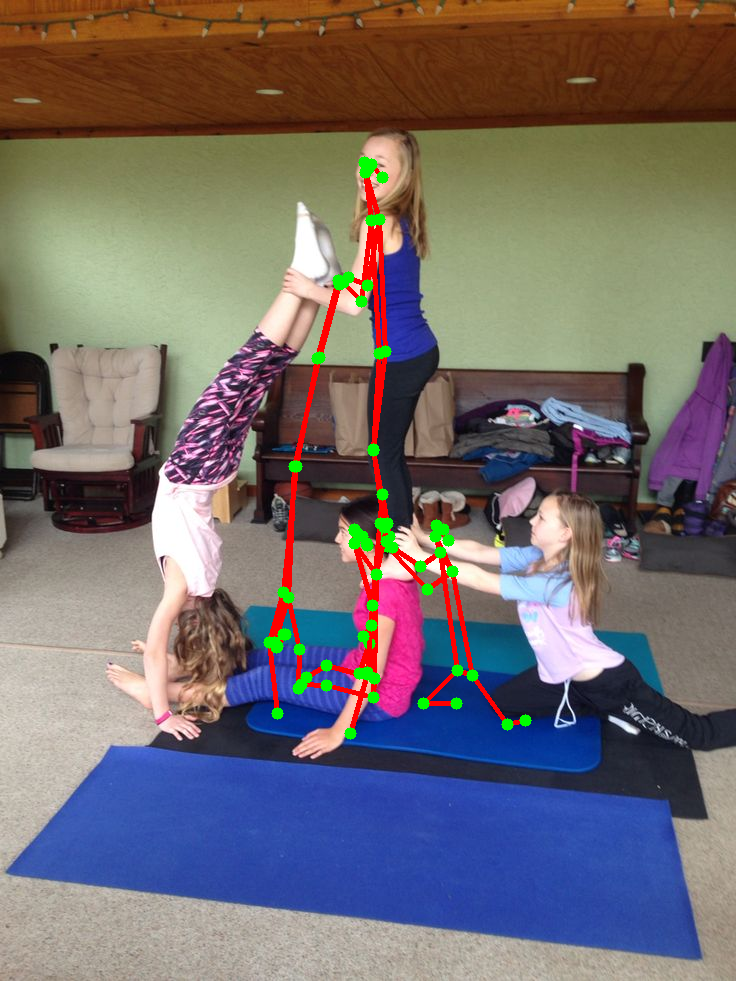

In [23]:
for filename in os.listdir(image_folder):
    if filename.endswith(('.jpeg', '.jpg', '.png', '.gif', '.bmp')):
        image_path = os.path.join(image_folder, filename)
        process_and_show_image(image_path,output_folder)